## ** Лабораторна робота 4.                                                                                                        Методи класифікації на основі машинного навчання на базі медичних даних**

## Мета роботи

Ця лабораторна робота присвячена застосуванню методів аналізу великих даних для дослідження поширення COVID-19 у світі. Розглядається розпізнавання та класифікація зображення на рентгенівському знімку грудної клітки для прогнозування діагнозу.

## Вступ

Рентгенівське випромінювання широко використовується в медичній практиці. Рентгенівські промені можна використовувати для діагностики різних захворювань. Однак діагноз залежить від досвіду лікаря, що може призвести до неправильного лікування. Сучасні методи штучного інтелекту та розпізнавання образів дозволяють створювати експертні системи, що дозволяють автоматично встановлювати діагноз.

Для виконання лабораторної роботи необхідно завантажити зображення, трансформувати їх і визначити основні ознаки, які лежать в основі класифікації захворювань.

Буде розглянуто два різних підходи до класифікації зображень (захворювань):
1. Різні класичні методи та їх порівняння; 
2. Згорткові нейронні мережі (Convolutional Neuron Network (CNN)).

## Матеріали та методи

У цій лабораторній роботі розглянуто основні методи класифікації зображень. Лабораторна робота складається з чотирьох етапів:
* Завантаження та попередня обробка зображень
* Створення властивостей зображень
* Порівняння різних класичних методів класифікації 
* Побудова та підгонка згорткової нейронної мережі

Статистичні дані отримані з https://www.kaggle.com/pranavraikokte/covid19-image-dataset на основі [CC BY-SA 4.0](https://creativecommons.org/licenses/by-sa/4.0/) ліцензії.

## Середовища виконання
* [Python](https://www.python.org)
* [os](https://docs.python.org/3/library/os.html)
* [numpy](https://numpy.org)
* [glob](https://docs.python.org/3/library/glob.html)
* [SeaBorn](https://seaborn.pydata.org)
* [Matplotlib](https://matplotlib.org)
* [mahotas](https://mahotas.readthedocs.io/en/latest/)
* [keras](https://keras.io)
* [scikit-learn](https://scikit-learn.org)
* [pandas](https://pandas.pydata.org)

## Отримані навики

Після виконання цієї лабораторної роботи ви зможете:

* Завантажувати та попередня обробка зображень.
* Створювати властивості зображень.
* Будувати різні класифікаційні моделі.
* Будувати моделі згорткових нейронних мереж.
* Визначати діагноз на основі рентгенівських зображень.

# Завантаження та попередня обробка зображень

## Встановлення необхідних бібліотек

Для виконання лабораторної роботи потрібно встановити додаткові бібліотеки або деякі оновити.

In [ ]:
# conda install matplotlib >= 3.4

In [ ]:
# conda config --add channels conda-forge

In [ ]:
!pip install mahotas

In [ ]:
# conda install scikit-learn

In [ ]:
# conda install -c conda-forge keras --yes

In [ ]:
# conda install -c conda-forge tensorflow --yes

## Імпорт необхідних бібліотек

Тут ми будемо використовувати Mahotas для обробки зображень і бібліотеку Keras для створення  моделі CNN та її навчання. Ми також будемо використовувати Matplotlib і Seaborn для візуалізації  набору даних, щоб краще зрозуміти зображення, які ми збираємося обробляти.
Ми також будемо використовувати бібліотеки os і glob для роботи з файлами і папками. NumPy буде застосовано до масивів зображень. Scikit-Learn буде використовуватися для класичних моделей класифікації. А для  порівняння класифікаторів візьмемо Pandas.

## Завантаження даних

 Для класифікації зображення мають бути однакового розміру. Щоб досягти цього, створимо глобальну змінну, яка визначатиме розмір (висоту та ширину) для зміни розміру зображення. Обидва в нашому випадку 224.

In [2]:
IMM_SIZE = 224

Для зручності ми створюємо функцію, яка завантажує та відображає всі картинки із зазначеного каталогу.
Для того, щоб класифікувати зображення, всі зображення повинні бути розміщені в підкаталогах. Назви цих підкаталогів насправді є іменами класів.
У нашому випадку зображення є рентгенівськими, які потрібно помістити у підпапки з назвами діагнозів.
Наприклад, підпапка COVID має містити рентгенівські знімки людей із цією хворобою.
Перш за все, ми повинні створити список підпапок, який є списком можливих класів захворювань. У нашому випадку це буде: Норма, COVID, Вірусна пневмонія.

Далі нам потрібно створити список усіх зображень.
Після цього  завантажимо та обробимо всі зображення:
1. завантажимо з  [mahotas.imread()](https://mahotas.readthedocs.io/en/latest/io.html)
2. Необхідно змінити розмір зображень до (IMM_SIZE x IMM_SIZE). Якщо зображення сірого кольору, воно подається у вигляді 2D-матриці: (висота, ширина). jpg та png зображення є 3D (висота, ширина, 3 або 4). Щоб це зробити треба використати: [mahotas.resize_to()](https://github.com/luispedro/mahotas/blob/master/mahotas/resize.py)
3. Якщо третій параметр форми зображення дорівнює 4, це означає альфа-канал. Ми можемо видалити його за допомогою  фрагментації зображення[:,:,:3].
4. Потім нам потрібно перетворити всі зображення в сірий 2D формат: [mahotas.colors.rgb2grey()](https://mahotas.readthedocs.io/en/latest/color.html)

Функція повертає масив кортежів [image, class name].


In [4]:
import os
from glob import glob
from matplotlib import pyplot as plt 
import cv2 as mh
import numpy as np

In [5]:
def get_data(folder):
    class_names = [f for f in os.listdir(folder) if not f.startswith('.')] # ctreate a list of SubFolders
    data = []
    print(class_names)
    for t, f in enumerate(class_names):
        images = glob(folder + "/" + f + "/*") # create a list of files
        print("Downloading: ", f)
        fig = plt.figure(figsize = (50,50)) 
        for im_n, im in enumerate(images):
            plt.gray() # set grey colormap of images
            image = mh.imread(im)
            if len(image.shape) > 2:
                image = mh.resize(image, (IMM_SIZE,IMM_SIZE), interpolation = mh.INTER_AREA) # resize of RGB and png images
            else:
                image = mh.resize(image, (IMM_SIZE,IMM_SIZE), interpolation = cmhv2.INTER_AREA) # resize of grey images    
            if len(image.shape) > 2:
                image = mh.cvtColor(image, mh.COLOR_BGR2GRAY)  # change of colormap of images alpha chanel delete
            plt.subplot(int(len(images)/5)+1,5,im_n+1) # create a table of images
            plt.imshow(image)
            data.append([image, f])
        plt.show()

    return np.array(data)   

Для навчання та тестування всі зображення слід розділити на навчальні та тестові групи та розмістити в окремих папках. Давайте завантажимо всі зображення у відповідні масиви.

['Covid', 'Normal', 'Viral Pneumonia']
Downloading:  Covid


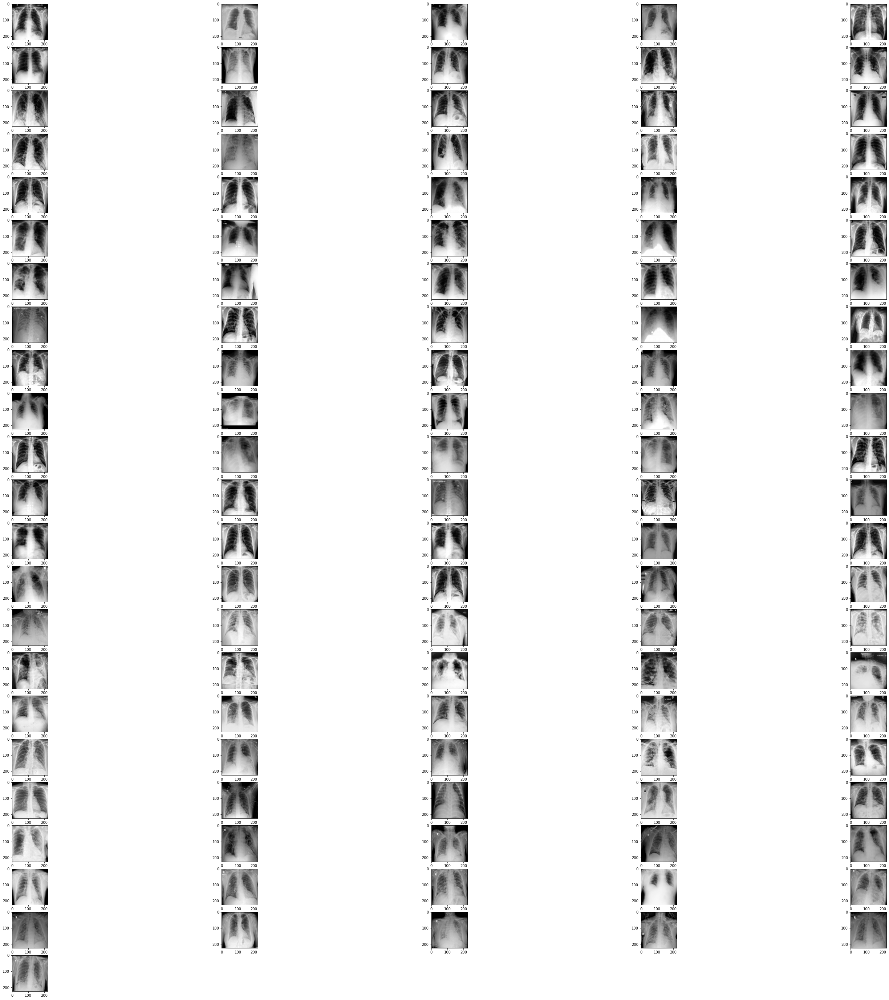

Downloading:  Normal


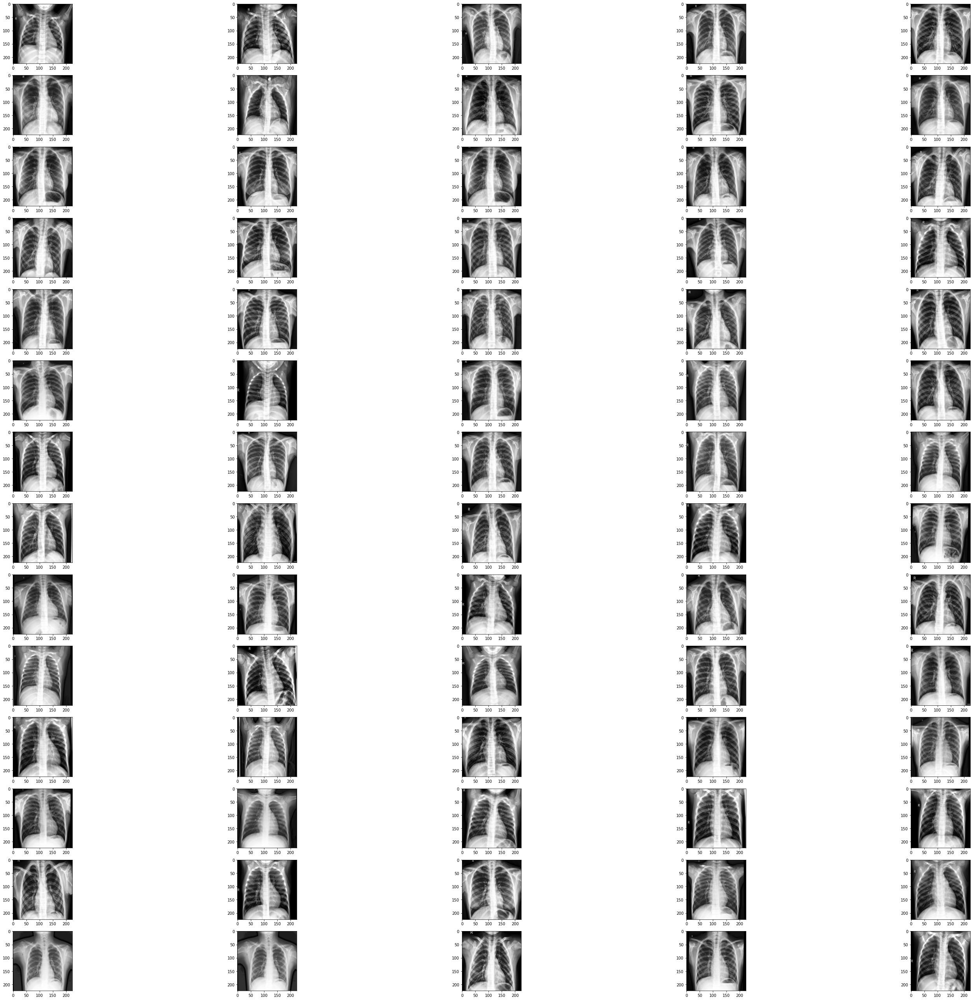

Downloading:  Viral Pneumonia


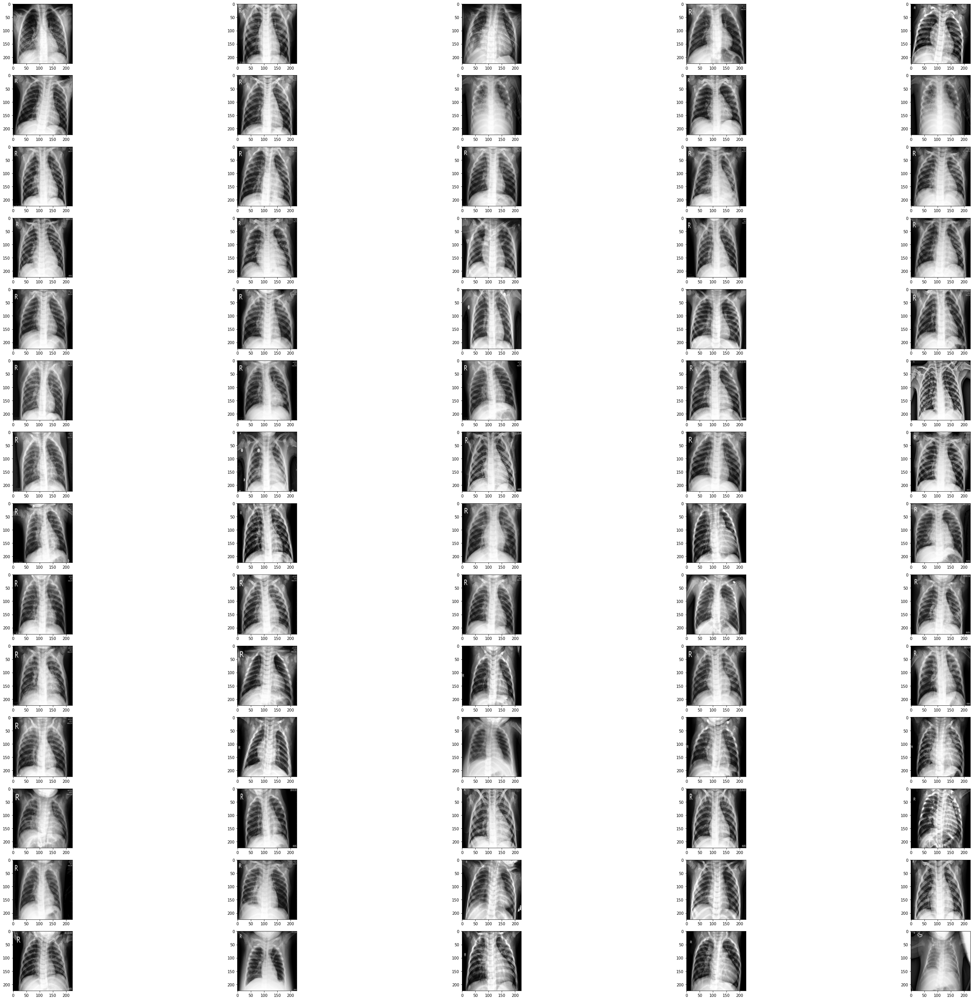

C:\Users\Roman\AppData\Local\Temp/ipykernel_20976/2784063864.py:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(data)


['Covid', 'Normal', 'Viral Pneumonia']
Downloading:  Covid


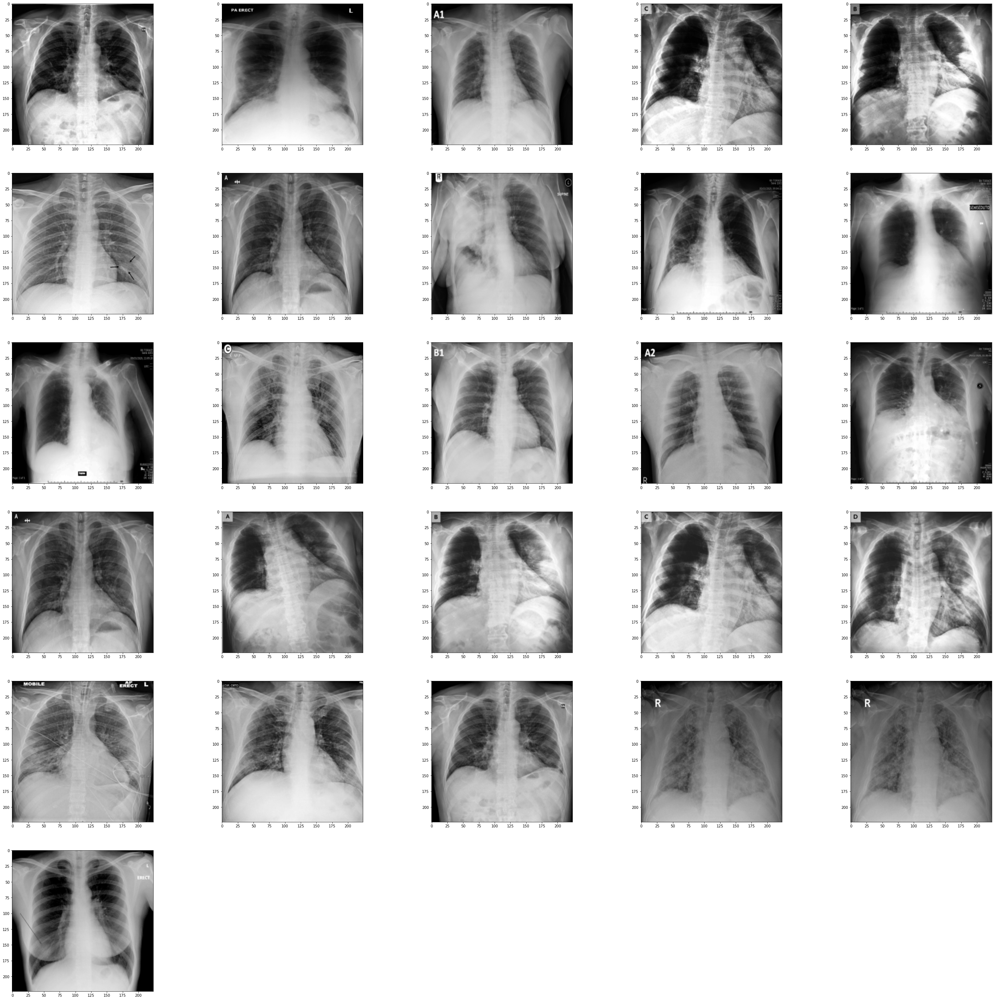

Downloading:  Normal


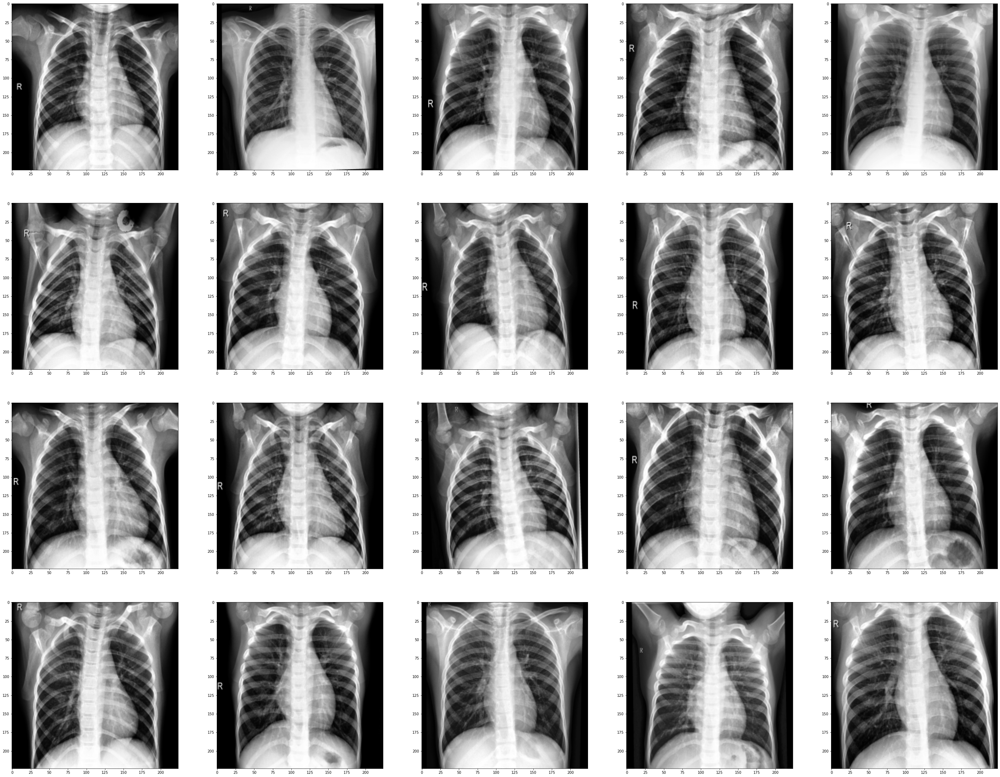

Downloading:  Viral Pneumonia


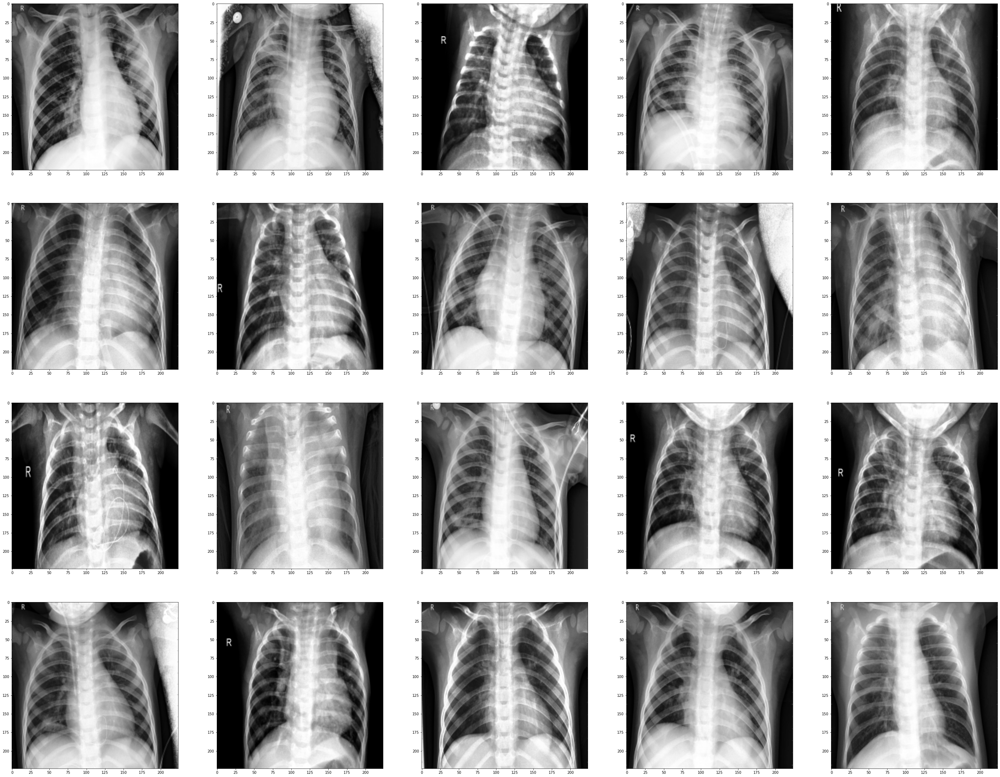

In [7]:
d = "datasets/train"
train = get_data(d)

d = "datasets/test"
val = get_data(d)

In [8]:
print("Train shape", train.shape) # Size of the training DataSet
print("Test shape", val.shape) # Size of the test DataSet
print("Image size", train[0][0].shape) # Size of image

Train shape (251, 2)
Test shape (66, 2)
Image size (224, 224)


Для навчання та тестування всі зображення слід розділити на навчальні та тестові групи та розмістити в окремих папках. Давайте завантажимо всі зображення у відповідні масиви.Як бачимо, навчальний DataSet складається з 251 зображення, а тестовий – із 66 зображень. Усі зображення у сірому 2D (224x224) форматі.

## Візуалізація даних 

Давайте візуалізуємо наші дані і подивимося, з чим саме ми працюємо. Використовуємо Seaborn для побудови графіка кількості зображень у всіх класах. Ви можете побачити, як виглядає результат.

In [9]:
import seaborn as sns

D:\Documents\IAD\IAD-LABS\venv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='count'>

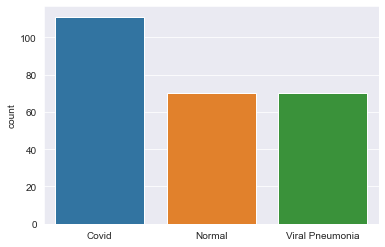

In [10]:
l = []
for i in train:
    l.append(i[1])
sns.set_style('darkgrid')
sns.countplot(l)

 також візуалізуємо перше зображення з класів Вірусна пневмонія та Covid у навчальному DataSet:

Text(0.5, 1.0, 'Viral Pneumonia')

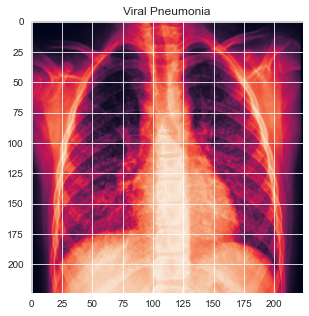

In [11]:
plt.figure(figsize = (5,5))
plt.imshow(train[np.where(train[:,1] == 'Viral Pneumonia')[0][0]][0])
plt.title('Viral Pneumonia')

Text(0.5, 1.0, 'Covid')

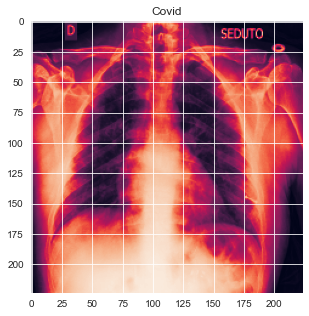

In [12]:
plt.figure(figsize = (5,5))
plt.imshow(train[np.where(train[:,1] == 'Covid')[0][0]][0])
plt.title('Covid')


## Створення властивостей зображення

Щоб класифікувати об’єкти, потрібно перетворити набір даних так, щоб вхідними були набір ознак, а виходом — клас об’єктів. Зображення - це матриця пікселів. Кожен піксель є кольором. Тому неможливо подати безпосередньо зображення на вхід класичного класифікатора. Необхідно перетворити кожне зображення в набір певних ознак.
Mahotas дозволяє легко розрахувати особливості зображення.
Відповідні функції можна знайти в підмодулі [mahotas.features](https://mahotas.readthedocs.io/en/latest/). Набір текстурних функцій Haralick добре відомий. Як і багато алгоритмів обробки зображень, він названий на честь свого винахідника. Функції засновані на текстурах, тобто розрізняють структуровані і неструктуровані зображення, а також різноманітні повторювані структури. За допомогою Mahotas ці характеристики розраховуються дуже легко:
haralick_features = mh.features.haralick (image)
haralick_features_mean = np.mean (haralick_features, axis = O)
haralick_features_all = np.ravel (haralick_features)
Функція mh.features.haralick повертає масив 4 x 13, який має бути перетворений в 1D за допомогою [NumPy.ravel()](https://numpy.org/doc/stable/reference/generated/numpy.ravel.html). Перший вимір — це чотири можливі напрямки, в яких обчислюються об’єкти (вертикаль, горизонталь і дві діагоналі). Якщо нас не цікавить якийсь конкретний напрямок, ми можемо усереднювати характеристики в усіх напрямках (у коді вище ця змінна називається haralick_features_mean). Крім того, ви можете використовувати всі характеристики окремо (змінна haralick_features_all). Вибір залежить від властивостей конкретного набору даних. Ми вирішили, що в нашому випадку вертикальні та горизонтальні об’єкти повинні зберігатися окремо, тому використовуємо haralick_features_all.


In [13]:
import mahotas as mh

 Слід створити функцію для утворення властивостей DataSet.

In [14]:
def create_features(data):
    features = []
    labels = []
    for image, label in data:
        features.append(mh.features.haralick(image).ravel())
        labels.append(label)
    features = np.array(features)
    labels = np.array(labels)
    return (features, labels) 

In [15]:
features_train, labels_train = create_features(train)
features_test, labels_test = create_features(val)

# Порівняння різних класичних методів класифікації

Якщо ми хочемо порівняти деякі класифікатори, нам слід використовувати конвеєр. Конвеєр допомагає об’єднати кілька оцінювачів в один. Це корисно, оскільки в обробці даних часто є фіксована кількість кроків, наприклад, вибір ознак, нормалізація та класифікація. Конвеєр тут виконує кілька цілей:

Вам потрібно лише один раз викликати fit(), щоб оцінити цілу послідовність оцінок.

Ви можете здійснювати пошук у сітці за параметрами всіх оцінок у конвеєрі одночасно.

Конвеєри допомагають уникнути витоку статистичних даних із ваших тестових даних у навчену модель під час перехресної перевірки, гарантуючи, що ті самі вибірки використовуються для навчання трансформаторів і предикторів. Усі оцінки в конвеєрі, крім останнього, повинні бути трансформаторами (тобто повинні мати метод перетворення). Остання оцінка може бути будь-якого типу (трансформатор, класифікатор тощо).

Модуль  [sklearn.pipeline](https://scikit-learn.org/stable/modules/classes.html?highlight=pipeline#module-sklearn.pipeline)  реалізує утиліти для побудови складеного оцінювача, як ланцюга перетворень і оцінок.

Щоб перевірити, як це працює, ми будемо використовувати LogisticRegression.


In [16]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import plot_confusion_matrix

ModuleNotFoundError: No module named 'sklearn'

In [ ]:
clf = Pipeline([('preproc', StandardScaler()), ('classifier', LogisticRegression())])
clf.fit(features_train, labels_train)
scores_train = clf.score(features_train, labels_train)
scores_test = clf.score(features_test, labels_test)
print('Training DataSet accuracy: {: .1%}'.format(scores_train), 'Test DataSet accuracy: {: .1%}'.format(scores_test))
plot_confusion_matrix(clf, features_test, labels_test)  
plt.show() 

Як бачимо, результати непогані. Матриця Conflusion matrix показує нам, скільки помилкових прогнозів ми отримали. Це дозволяє нам перевірити інші класифікатори та порівняти результати. 
Ми перевіримо:
* [Logistic Regression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html?highlight=logistic%20regression#sklearn.linear_model.LogisticRegression)
* [Nearest Neighbors](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.NearestNeighbors.html?highlight=nearest%20neighbors#sklearn.neighbors.NearestNeighbors)
* [Linear SVM](https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVR.html?highlight=linear%20svm#sklearn.svm.LinearSVR)
* [RBF SVM](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.kernels.RBF.html?highlight=rbf#sklearn.gaussian_process.kernels.RBF)
* [Gaussian Process](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.GaussianProcessClassifier.html?highlight=gaussianprocessclassifier#sklearn.gaussian_process.GaussianProcessClassifier)
* [Decision Tree](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html?highlight=decisiontreeclassifier#sklearn.tree.DecisionTreeClassifier)
* [Random Forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html?highlight=randomforestclassifier#sklearn.ensemble.RandomForestClassifier)
* [Multi-layer Perceptron classifier](https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html?highlight=mlpclassifier#sklearn.neural_network.MLPClassifier)
* [Ada Boost](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html?highlight=adaboostclassifier#sklearn.ensemble.AdaBoostClassifier)
* [Naive Bayes](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html?highlight=gaussiannb#sklearn.naive_bayes.GaussianNB)
* [Quadratic Discriminant Analysis](https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis.html?highlight=quadraticdiscriminantanalysis#sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.gaussian_process.kernels import RBF

In [ ]:
names = ["Logistic Regression", "Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "QDA"]

classifiers = [
    LogisticRegression(),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]
scores_train = []
scores_test = []
for name, clf in zip(names, classifiers):
    clf = Pipeline([('preproc', StandardScaler()), ('classifier', clf)])
    clf.fit(features_train, labels_train)
    score_train = clf.score(features_train, labels_train)
    score_test = clf.score(features_test, labels_test)
    scores_train.append(score_train)
    scores_test.append(score_test)

Виведемо результати у таблицю.

In [ ]:
import pandas as pd

In [ ]:
res = pd.DataFrame(index = names)
res['scores_train'] = scores_train
res['scores_test'] = scores_test
res.columns = ['Test','Train']
res.index.name = "Classifier accuracy"
pd.options.display.float_format = '{:,.2f}'.format
print(res)

Ви можете бачити, що обчислення дуже швидкі і що логістична регресія та нейронна мережа показують найкращий результат для тестового набору даних.

Давайте порівняємо результати на графіку.

In [ ]:
x = np.arange(len(names))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, scores_train, width, label='Train')
rects2 = ax.bar(x + width/2, scores_test, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy of classifiers')
ax.set_xticks(x)
plt.xticks(rotation = 90)
ax.set_xticklabels(names)
ax.legend()

fig.tight_layout()

plt.show()

# Побудова та підгонка згорткової нейронної мережі

## Імпорт необхідних бібліотек

Будемо використовувати бібліотеку Keras для створення та навчання нашої моделі.

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout 
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from sklearn.metrics import classification_report,confusion_matrix

## Попередня обробка даних і збільшення даних

What is different about [Convolutional Neural Networks](https://en.wikipedia.org/wiki/Convolutional_neural_network) is that we can submit images directly to the input. However, these images also require pre-processing. 

In particular, it is necessary to normalize the pixels color, i.e. to normalize them from the range [0, 255) to [0, 1).

You also need to change the dimension of the input images because of Keras framework. 

Image classes should be of numeric type instead of string.

The code below makes the necessary transformations.
Згорткові нейронні мережі відрізняються тим, що ми можемо подавати зображення безпосередньо на вхід. Однак ці зображення також потребують попередньої обробки.

Зокрема, необхідно нормалізувати колір пікселів, тобто нормалізувати їх від діапазону [0, 255) до [0, 1).

Вам також потрібно змінити розміри вхідних зображень через Keras Framework.

Класи зображень повинні мати числовий тип, а не рядковий.

Наведений нижче код здійснює необхідні перетворення.


In [ ]:
x_train = []
y_train = []
x_val = []
y_val = []

for feature, label in train:
    x_train.append(feature)
    y_train.append(label)

for feature, label in val:
    x_val.append(feature)
    y_val.append(label)

# Normalize the data
x_train = np.array(x_train) / 255
x_val = np.array(x_val) / 255

# Reshaping input images
x_train = x_train.reshape(-1, IMM_SIZE, IMM_SIZE, 1)
x_val = x_val.reshape(-1, IMM_SIZE, IMM_SIZE, 1)

# Creating a dictionary of clases
lab = {}
for i, l in enumerate(set(y_train)):
    lab[l] = i


y_train = np.array([lab[l] for l in y_train])
y_val = np.array([lab[l] for l in y_val])

In [ ]:
print("Shape of the input DataSet:", x_train.shape)
print("Shape of the output DataSet:", y_train.shape)
print("Dictionary of classes:", lab)

## Збільшення даних на навчальній вибірці

Треба виконати збільшення даних, щоб краще навчити  моделі.

In [ ]:
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range = 30,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.2, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip = True,  # randomly flip images
        vertical_flip=False)  # randomly flip images


datagen.fit(x_train)

## Визначення моделі

Let’s define a simple CNN model with 3 Convolutional layers followed by max-pooling layers. A dropout layer is added after the 3rd maxpool operation to avoid overfitting.Давайте визначимо просту модель CNN з 3 згортковими шарами, за якими слідують шари максимального об’єднання. Після 3-ї операції maxpool додається шар, що випадає, щоб уникнути перенавчання.

In [ ]:
model = Sequential()
model.add(Conv2D(32,1,padding="same", activation="relu", input_shape=(IMM_SIZE,IMM_SIZE,1)))
model.add(MaxPool2D())

model.add(Conv2D(32, 1, padding="same", activation="relu"))
model.add(MaxPool2D())

model.add(Conv2D(64, 1, padding="same", activation="relu"))
model.add(MaxPool2D())
model.add(Dropout(0.4))

model.add(Flatten())
model.add(Dense(128,activation="relu"))
model.add(Dense(3, activation="softmax"))

model.summary()

Let’s compile the model now using Adam as our optimizer and SparseCategoricalCrossentropy as the loss function. We are using a lower learning rate of 0.000001 for a smoother curve.Давайте зараз зкомпілюємо модель, використовуючи Adam як наш оптимізатор і SparseCategoricalCrossentropy як функцію втрат. Ми використовуємо нижчу швидкість навчання 0,000001 для більш плавної кривої.


In [ ]:
opt = Adam(lr=0.0001)
model.compile(optimizer = opt , loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True) , metrics = ['accuracy'])

Тепер давайте потренуємо нашу модель для **2000** епох. Правда, процес підгонки йде дуже повільно. Тому ми зберегли підібрану модель у файл. Щоб заощадити час, ми завантажимо підібрану модель. Якщо ви бажаєте, ви можете змінити налаштування параметра **fitting to True**, щоб змінити модель.


In [ ]:
fitting = False
fitting_save = False
epochs = 200

import pickle

if fitting:
    history = model.fit(x_train,y_train,epochs = epochs , validation_data = (x_val, y_val), shuffle = True)
    if fitting_save:
    # serialize model to JSON
        model_json = model.to_json()
        with open("model.json", "w") as json_file:
            json_file.write(model_json)
        # serialize weights to HDF5
        model.save_weights("model.h5")
        print("Saved model to disk")
        with open('history.pickle', 'wb') as f:
            pickle.dump(history.history, f)
        with open('lab.pickle', 'wb') as f:
            pickle.dump(lab, f)
# load model  
from keras.models import model_from_json
json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into a new model
model.load_weights("model.h5")        
with open('history.pickle', 'rb') as f:
    history = pickle.load(f)
print("Loaded model from disk")

## Оцінка результатів

Ми відобразимо точність навчання та перевірки разом із втратою  та оцінкою навчання 

In [ ]:
acc = history['accuracy']
val_acc = history['val_accuracy']
loss = history['loss']
val_loss = history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(15, 15))
plt.subplot(2, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Давайте подивимося, як виглядає крива. Ви можете бачити, що точність наборів навчання та перевірки однакова. Функція втрат валідаційних і навчальних наборів є стабільною. Це означає, що наш CNN добре підібраний і може бути використаний для класифікації.

Ми можемо роздрукувати звіт про класифікацію, щоб побачити точність і точність за допомогою Pandas і Seaborn.heatmap() [model.predict_classes()]() and [classification_report()]().

Також ми можемо створити матрицю confusion matrix. На жаль, фреймворк Keras не має функції plot_confusion_matrix(). Тому ми повинні створити його за допомогою Pandas і [Seaborn.heatmap()]()


In [ ]:
# Classification report
predictions = model.predict(x_val)
predictions=np.argmax(predictions,axis=1)
predictions = predictions.reshape(1,-1)[0]
print(classification_report(y_val, predictions, target_names = lab.keys()))

# Confusion matrix
cm = pd.DataFrame(confusion_matrix(y_val, predictions))
cm.index = ["Predicted " + s for s in lab.keys()]
cm.columns = ["True  " + s for s in lab.keys()]
print(cm)

sns.heatmap(confusion_matrix(y_val, predictions), annot=True, 
            xticklabels = list(lab.keys()), yticklabels = list(lab.keys()))
plt.xlabel("True labels")
plt.ylabel("Predicted labels")
plt.show()

In [ ]:
# Accuracy




z = np.argmax(model.predict(x_train)) == y_train


scores_train = sum(z+0)/len(z)


z = np.argmax(model.predict(x_val)) == y_val



scores_test = sum(z+0)/len(z)


print('Training DataSet accuracy: {: .1%}'.format(scores_train), 'Test DataSet accuracy: {: .1%}'.format(scores_test))

As you can see, the CNN shows better results than classical models. However, fitting takes much longer.Як бачимо, CNN показує кращі результати, ніж класичні моделі. Однак підгонка займає набагато більше часу.

А тепер спробуйте самостійно створити функцію, яка буде встановлювати діагноз на основі CNN.

In [ ]:
def diagnosis(file):
    
    try:
        image = mh.imread(file)
    except:
        print("Cannot download image: ", file)
        return
    
    if len(image.shape) > 2:
        image = mh.resize_to(image, [IMM_SIZE, IMM_SIZE, image.shape[2]]) #resize of images RGB and png
    else:
        image = mh.resize_to(image, [IMM_SIZE, IMM_SIZE]) #resize of grey images    
    if len(image.shape) > 2:
        image = mh.colors.rgb2grey(image[:,:,:3], dtype = np.uint8)  #change of colormap of images alpha chanel delete
    plt.gray()
    plt.imshow(image)
    plt.show()
    from keras.models import model_from_json
    json_file = open('model.json', 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    model = model_from_json(loaded_model_json)
    
    model.load_weights("model.h5")        
    with open('history.pickle', 'rb') as f:
        history = pickle.load(f)
    with open('lab.pickle', 'rb') as f:
        lab = pickle.load(f)
    image = np.array(image) / 255
    image = image.reshape(-1, IMM_SIZE, IMM_SIZE, 1)
    diag = np.argmax(model.predict(image), axis=-1)
    diag =list(lab.keys())[list(lab.values()).index(diag[0])]

    
    return diag

In [ ]:
print ("Diagnosis is:", diagnosis("Covid19-dataset/test/Covid/0120.jpg"))
print ("Diagnosis is:", diagnosis("Covid19-dataset/test/Normal/0105.jpeg"))
print ("Diagnosis is:", diagnosis("Covid19-dataset/test/Viral Pneumonia/0111.jpeg"))


## Висновки

У даній лабораторній роботія розглянуто, як створити експертну систему, що дає змогу отримувати діагноз на основі рентгенівських зображень, використовуючи різні класифікатори. Ці принципи можна використовувати для будь-якого типу рентгенівських зображень, а не лише для діагностики COVID.

Під час цієї лабораторної роботи реалізовано завантаження та обробка зображень. Ми навчилися витягувати ознаки зображень і створювати/підходити/тестувати/порівнювати набори класифікаторів. Також ми дізналися, як створювати та підлаштовувати згорткові нейронні мережі. Реалізовано порівняння точності різних класифікаторів.